In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.4/887.4 kB 31.5 MB/s eta 0:00:00


In [4]:
from ultralytics import YOLO
from IPython.display import Image,display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [5]:
from ultralytics import YOLO

# Load a pre-trained YOLO model (you can choose n, s, m, l, or x versions)
model = YOLO("yolo11x.pt")

100%|██████████| 109M/109M [00:00<00:00, 463MB/s] 


In [1]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="oGoCvjxBuj08jQSCGrDi")
project = rf.workspace("sanket-gurav-wdafl").project("missile-detection-gzysv")
version = project.version(7)
dataset = version.download("yolov11")
                

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 4.5 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Missile-Detection-7 in yolov11:: 100%|██████████| 12822/12822 [00:01<00:00, 8504.50it/s] 


In [6]:
!yolo task=detect mode=train model="/kaggle/working/yolo11x.pt" data="/kaggle/working/Missile-Detection-7/data.yaml" epochs=15 imgsz=640 batch=32 plots=True freeze=10

Ultralytics 8.3.34 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/working/yolo11x.pt, data=/kaggle/working/Missile-Detection-7/data.yaml, epochs=15, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=10, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_

In [7]:
!yolo detect val model='/kaggle/working/runs/detect/train/weights/best.pt' data='/kaggle/working/Missile-Detection-7/data.yaml'

Ultralytics 8.3.34 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11x summary (fused): 464 layers, 56,828,179 parameters, 0 gradients, 194.4 GFLOPs
val: Scanning /kaggle/working/Missile-Detection-7/valid/labels.cache... 801 imag
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        801        975      0.784      0.786      0.811      0.476
Speed: 0.5ms preprocess, 31.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [38]:
import json
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch

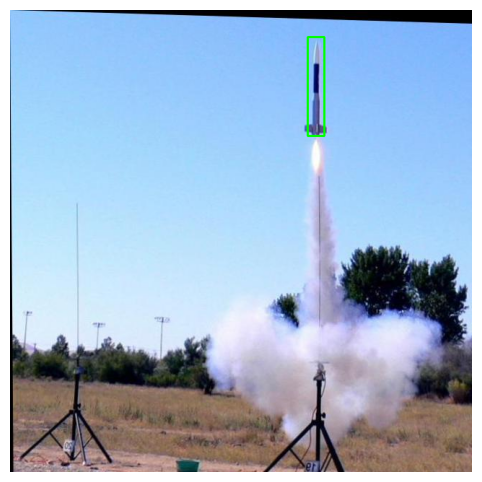

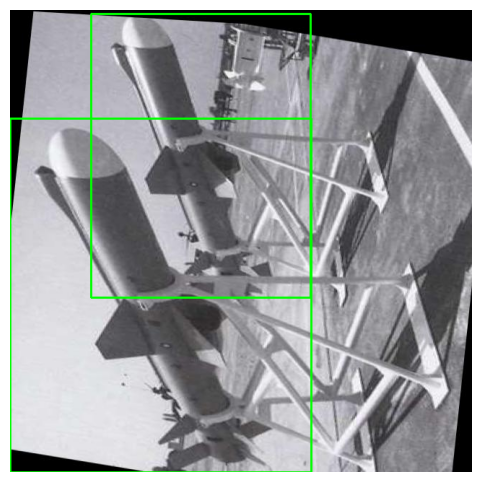

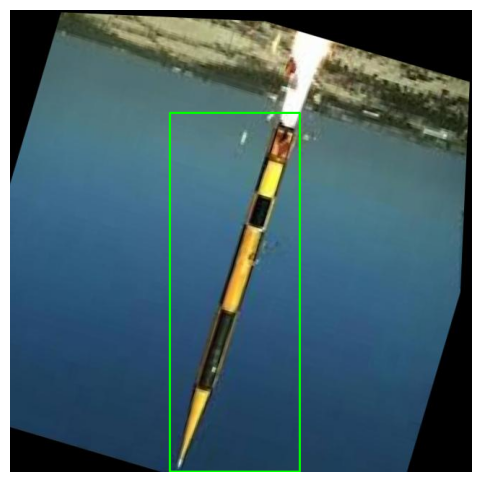

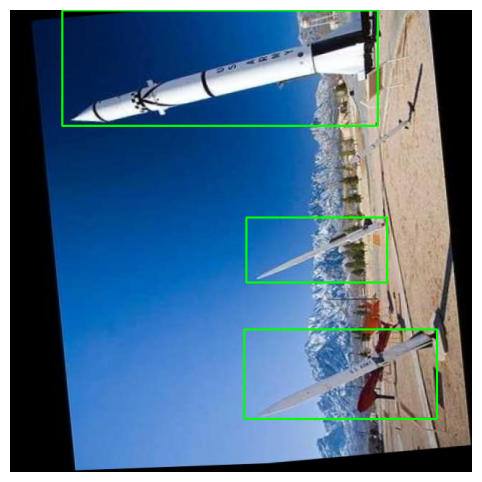

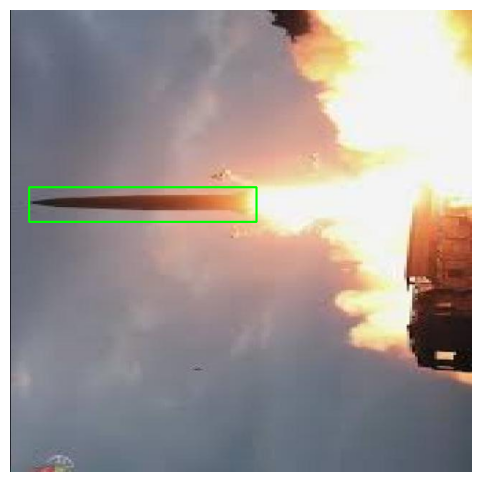

...

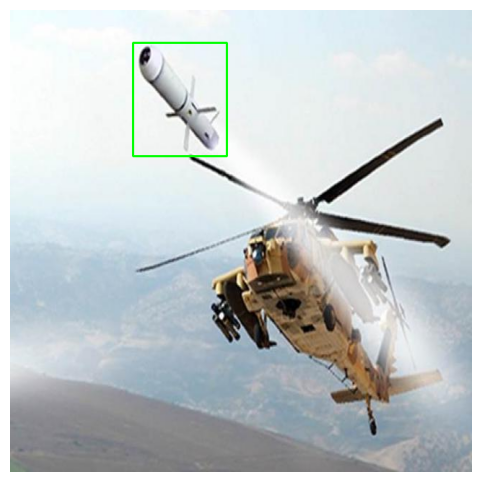

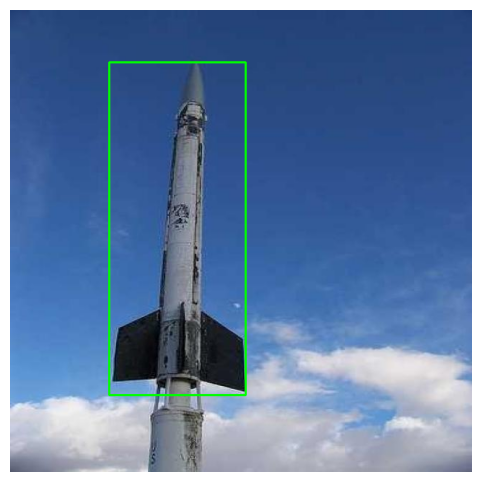

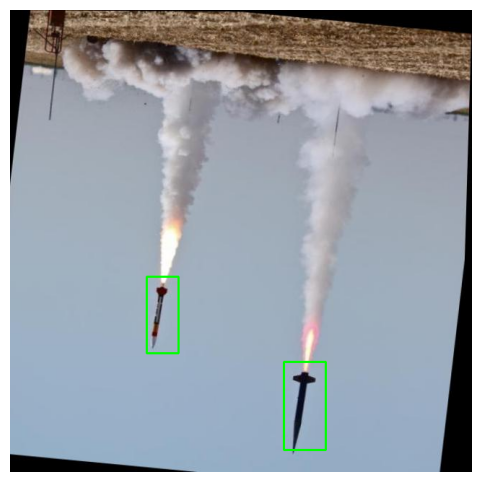

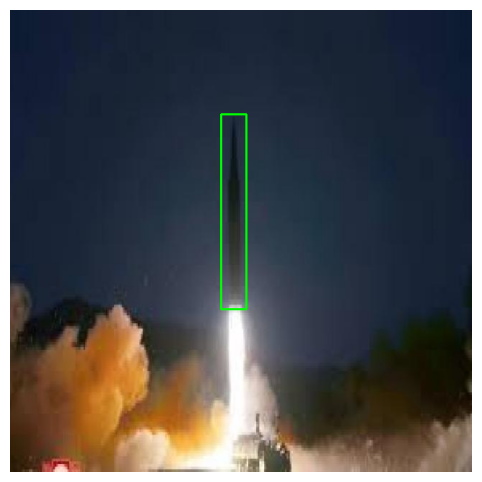

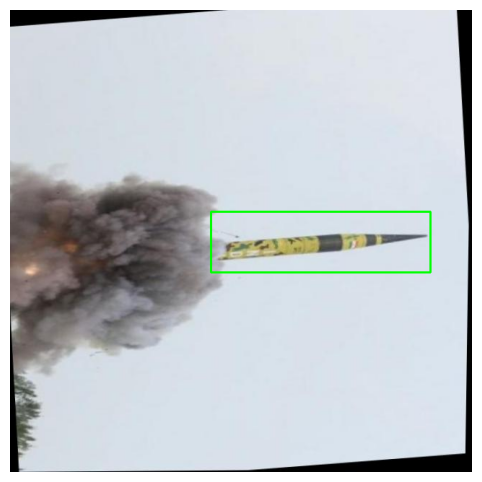

In [9]:
import os
import cv2
import matplotlib.pyplot as plt

class_names = {
    24: 'missile',
}

images = os.listdir('/kaggle/working/Missile-Detection-7/train/images')

for image_path in images[10:25]:
    image_full_path = os.path.join('/kaggle/working/Missile-Detection-7/train/images', image_path)
    image = cv2.imread(image_full_path)

    label_path = os.path.join('/kaggle/working/Missile-Detection-7/train/labels', f"{os.path.splitext(image_path)[0]}.txt")
    try:
        with open(label_path, "r") as file:
            lines = file.readlines()
        bboxes = []

        for line in lines:
            values = line.strip().split()

            if len(values) == 5:
                class_id, x_center, y_center, width, height = map(float, values)
            else:
                # Handle lines with more values
                class_id = float(values[0])
                x_coords = [float(values[i]) for i in range(1, len(values), 2)]
                y_coords = [float(values[i + 1]) for i in range(1, len(values), 2)]
                x_min, y_min = min(x_coords), min(y_coords)
                x_max, y_max = max(x_coords), max(y_coords)
                x_center = (x_min + x_max) / 2
                y_center = (y_min + y_max) / 2
                width = x_max - x_min
                height = y_max - y_min

            # Store bbox in the expected format
            bboxes.append([class_id, x_center, y_center, width, height])

    except FileNotFoundError:
        print(f"Label not found for {image_path}")
        continue

    for bbox in bboxes:
        class_id, x_center, y_center, width, height = bbox
        image_height, image_width, _ = image.shape
        x_min = int((x_center - width / 2) * image_width)
        y_min = int((y_center - height / 2) * image_height)
        box_width = int(width * image_width)
        box_height = int(height * image_height)
        color = (0, 255, 0)

        cv2.rectangle(image, (x_min, y_min), (x_min + box_width, y_min + box_height), color, 2)

        if class_id in class_names:
            class_name = class_names[class_id]
            label = f"{class_name}"
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 1
            font_thickness = 2
            cv2.putText(image, label, (x_min, y_min - 10), font, font_scale, color, font_thickness)

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 6))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()



image 1/1 /kaggle/working/Missile-Detection-7/train/images/81edc5391a3d5cb6_jpg.rf.31aa3e8f05d59ab2c4cf4f2a5c17d01c.jpg: 640x640 1 missile, 40.1ms
Speed: 4.8ms preprocess, 40.1ms inference, 128.2ms postprocess per image at shape (1, 3, 640, 640)


Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)


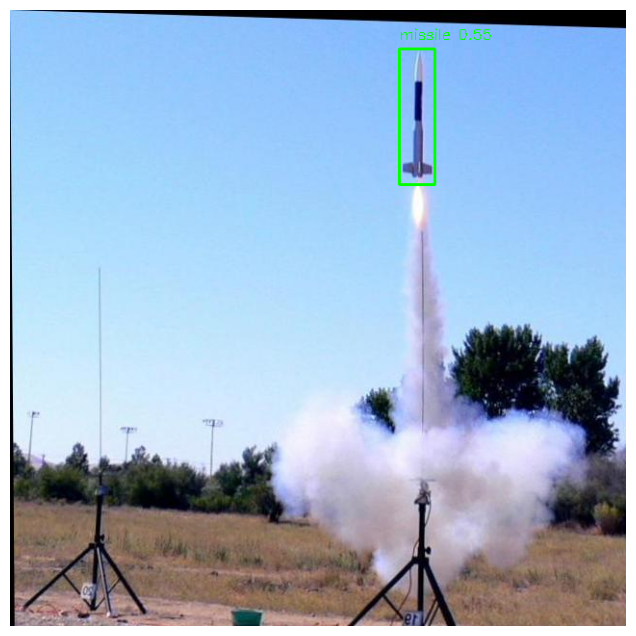


image 1/1 /kaggle/working/Missile-Detection-7/train/images/J8ZCZ60WNSFA_jpg.rf.5fc1195cdc181fd89a848fc868594768.jpg: 640x640 2 missiles, 39.9ms
Speed: 1.8ms preprocess, 39.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


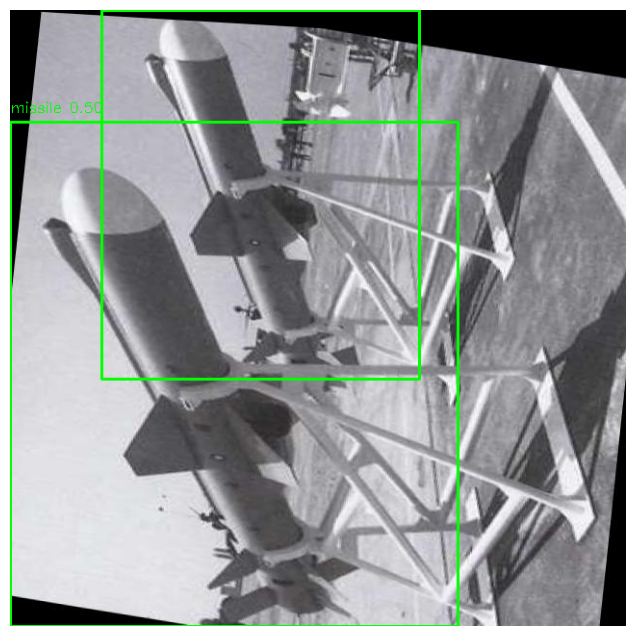


image 1/1 /kaggle/working/Missile-Detection-7/train/images/Missile_2564_jpg.rf.a6525e4712d09b4696fcdaf188645b9f.jpg: 640x640 1 missile, 39.6ms
Speed: 1.6ms preprocess, 39.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


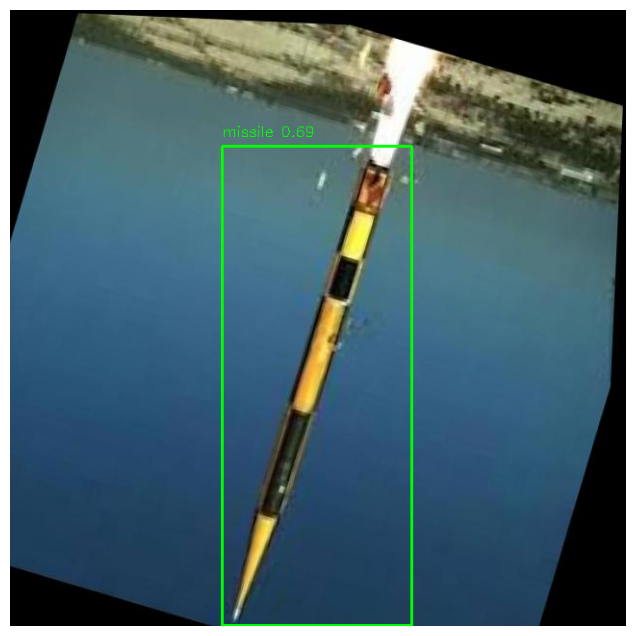


image 1/1 /kaggle/working/Missile-Detection-7/train/images/RH7DKG1DU302_jpg.rf.0af414086f750ace98e01a970ddcdd47.jpg: 640x640 3 missiles, 39.8ms
Speed: 2.1ms preprocess, 39.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


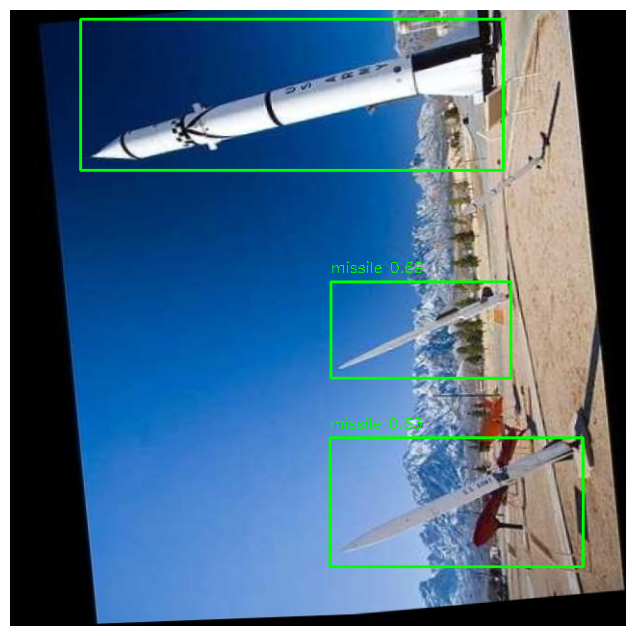


image 1/1 /kaggle/working/Missile-Detection-7/train/images/Missile_1969_jpg.rf.0c4053b24b77d08866d3af661f199879.jpg: 640x640 2 missiles, 39.5ms
Speed: 1.7ms preprocess, 39.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


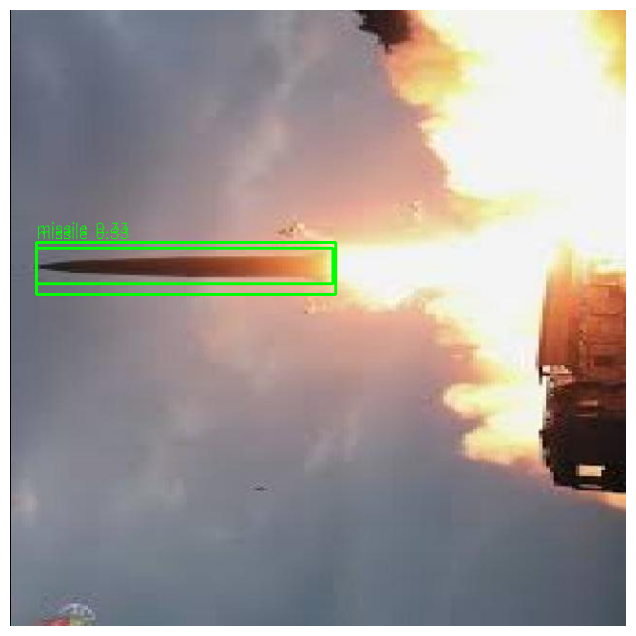


image 1/1 /kaggle/working/Missile-Detection-7/train/images/071_jpg.rf.e24683a1a0cfa9f835e8836dbb22e154.jpg: 640x640 1 missile, 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


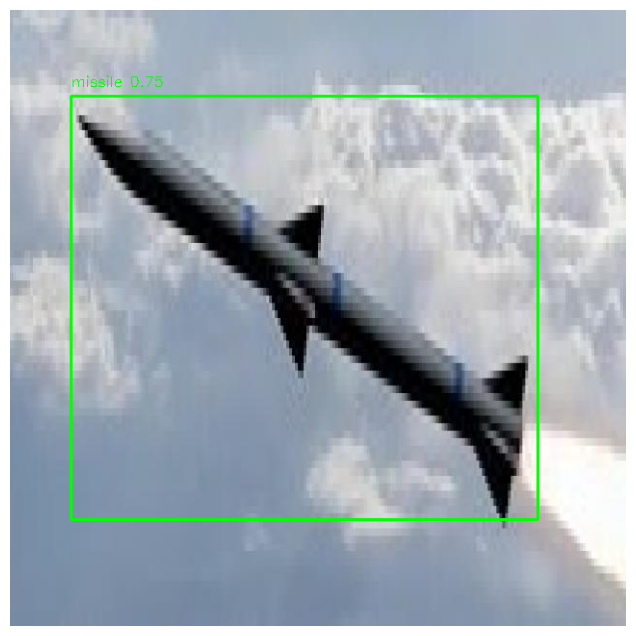


image 1/1 /kaggle/working/Missile-Detection-7/train/images/00000639_jpg.rf.ebf7906c7a82959b993719d0182a6807.jpg: 640x640 (no detections), 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


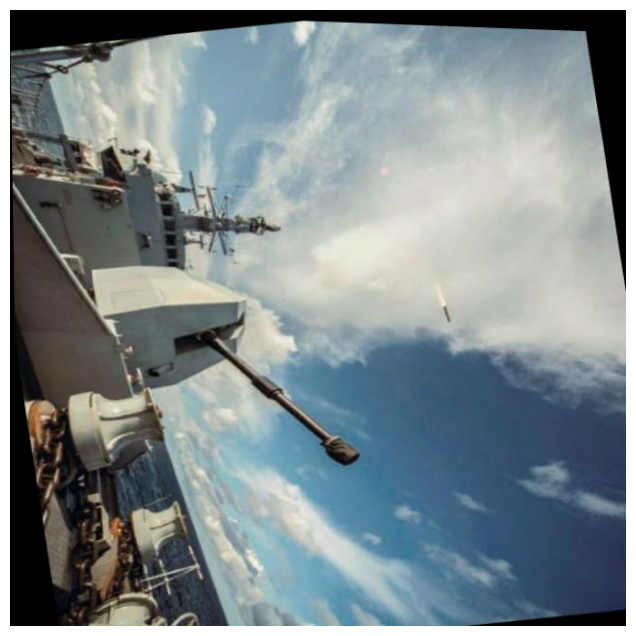


image 1/1 /kaggle/working/Missile-Detection-7/train/images/00000274_jpg.rf.8eb6dad1a743b781ddc15d67fbee1720.jpg: 640x640 2 missiles, 39.9ms
Speed: 1.6ms preprocess, 39.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


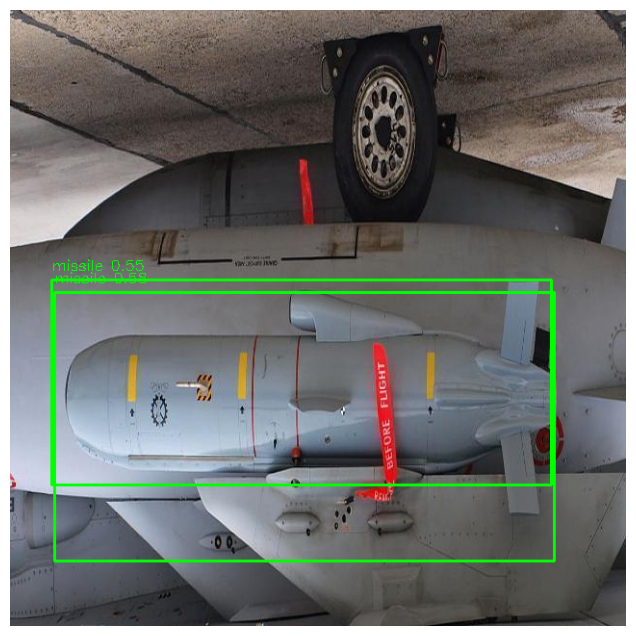


image 1/1 /kaggle/working/Missile-Detection-7/train/images/00000002_jpg.rf.3a3905b258edcb981e5655c33da1305b.jpg: 640x640 1 missile, 40.1ms
Speed: 2.2ms preprocess, 40.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


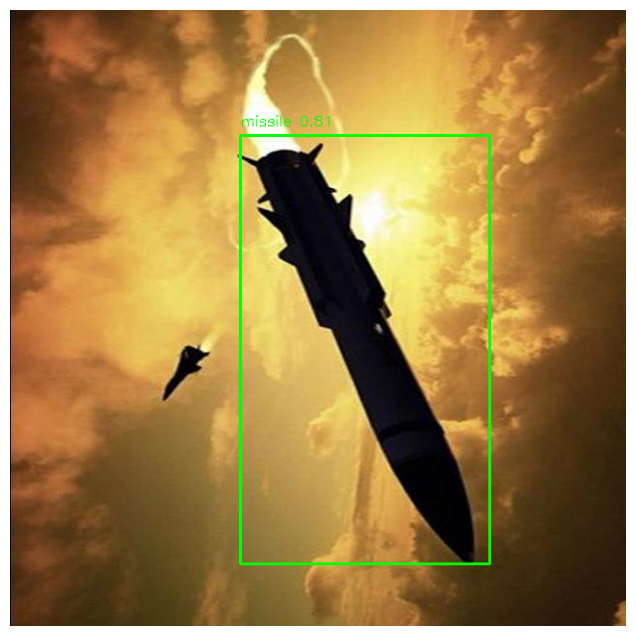


image 1/1 /kaggle/working/Missile-Detection-7/train/images/698616e9d8a7c142_jpg.rf.da875ec29d238c67e699b472d4ac1e20.jpg: 640x640 1 missile, 40.0ms
Speed: 2.1ms preprocess, 40.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


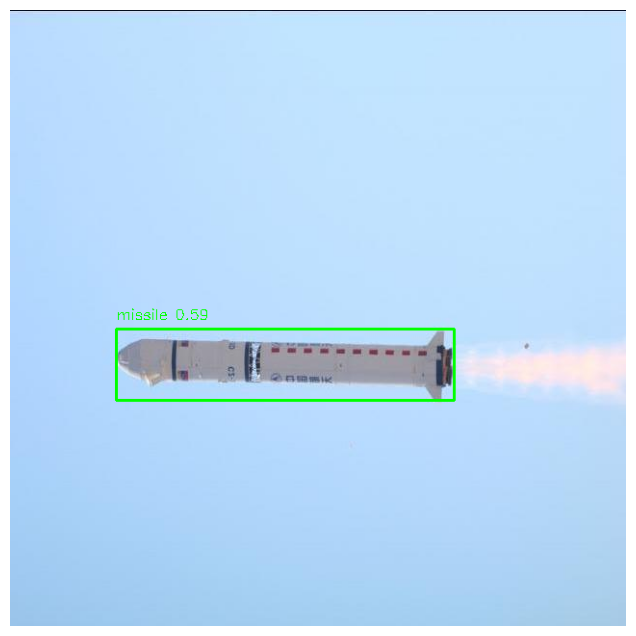


image 1/1 /kaggle/working/Missile-Detection-7/train/images/00000796_jpg.rf.f08ccaeb68cc7164cee909259982d2cb.jpg: 640x640 1 missile, 39.4ms
Speed: 1.6ms preprocess, 39.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


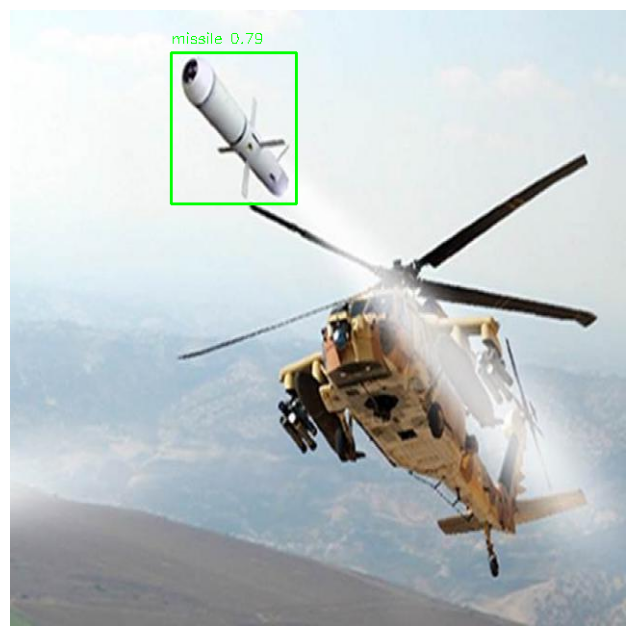


image 1/1 /kaggle/working/Missile-Detection-7/train/images/D4KLFEU35MR7_jpg.rf.6ab8f4916dd227f6250ee97a49ed327e.jpg: 640x640 2 missiles, 39.4ms
Speed: 1.6ms preprocess, 39.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


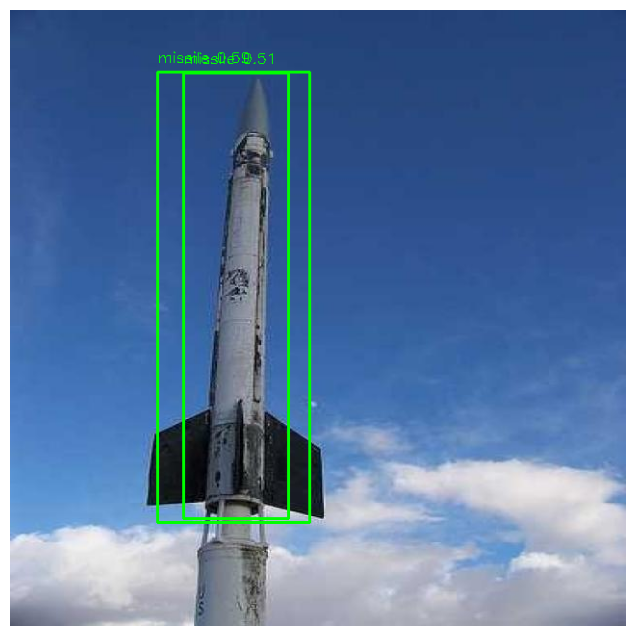


image 1/1 /kaggle/working/Missile-Detection-7/train/images/2b4ac12ac83933b6_jpg.rf.f220394335977e7814f796ddd0d8b342.jpg: 640x640 2 missiles, 40.0ms
Speed: 1.6ms preprocess, 40.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


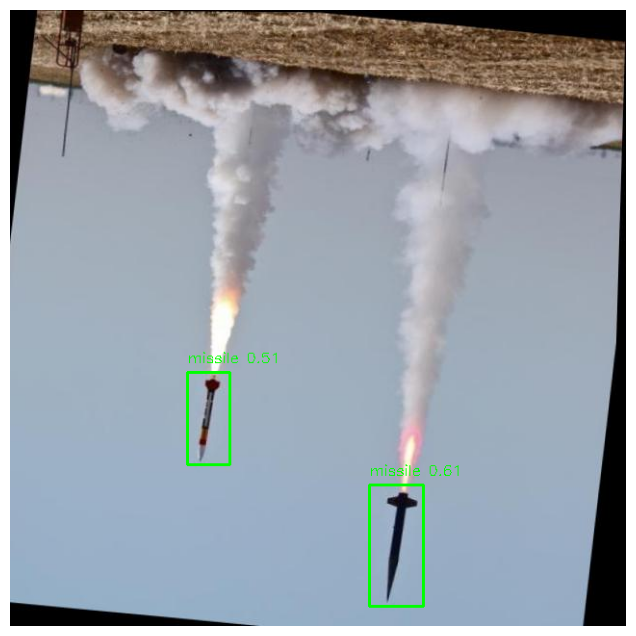


image 1/1 /kaggle/working/Missile-Detection-7/train/images/Missile_2234_jpg.rf.d17a3ed7751d202ce086a409b7f0e632.jpg: 640x640 1 missile, 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


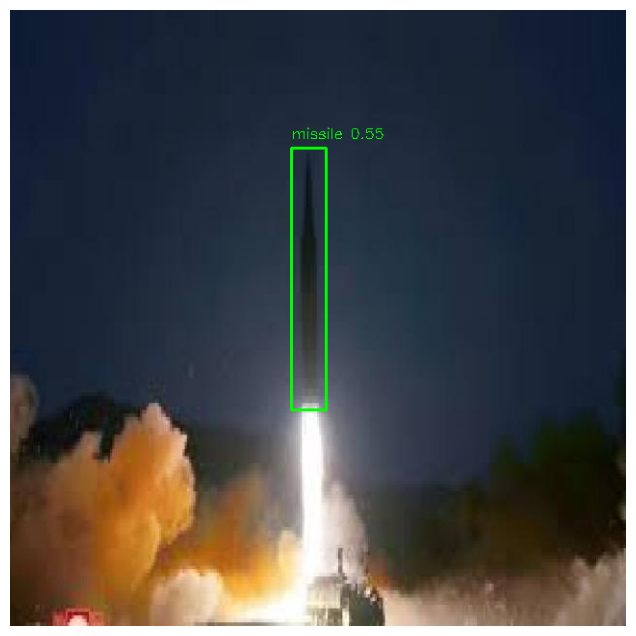


image 1/1 /kaggle/working/Missile-Detection-7/train/images/00000883_jpg.rf.27dea0b4dd2d890e7116a623c94b688a.jpg: 640x640 1 missile, 39.5ms
Speed: 2.0ms preprocess, 39.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


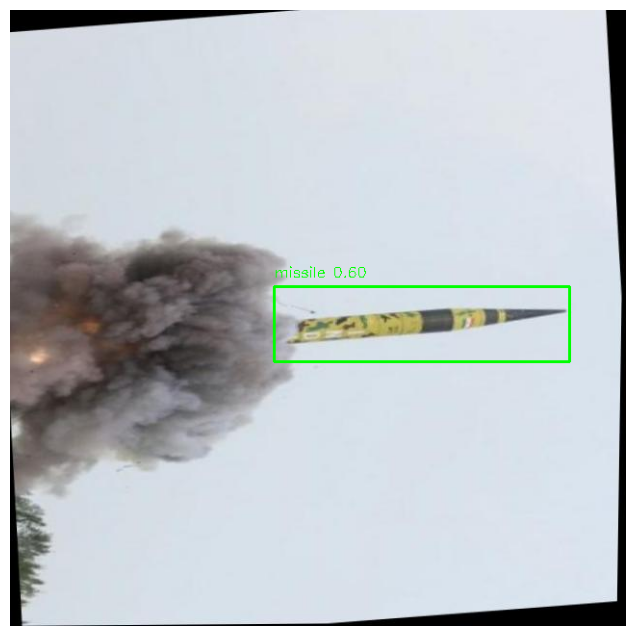

In [10]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load the YOLOv5 model (assuming you have yolov5s.pt weights file)
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Define the class names based on YOLOv5 classes
class_names = model.names

# Define the path to the images directory
images_path = '/kaggle/working/Missile-Detection-7/train/images'
image_files = os.listdir(images_path)

for image_file in image_files[10:25]:
    image_path = os.path.join(images_path, image_file)
    image = cv2.imread(image_path)

    if image is None:
        print(f"Could not read image {image_path}")
        continue

    # Perform object detection
    results = model(image_path)

    for result in results[0].boxes:  # boxes attribute for bounding boxes
        x_min, y_min, x_max, y_max = result.xyxy[0].cpu().numpy()
        confidence = result.conf.cpu().numpy()
        class_id = result.cls.cpu().numpy()

        x_min = int(x_min)
        y_min = int(y_min)
        x_max = int(x_max)
        y_max = int(y_max)

        color = (0, 255, 0)  # Green color for the bounding boxes
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 2)

        class_name = class_names[int(class_id)]
        label = f"{class_name} {confidence[0]:.2f}"  # Extract the single element from the array
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.5
        font_thickness = 1
        cv2.putText(image, label, (x_min, y_min - 10), font, font_scale, color, font_thickness)

    # Convert BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with bounding boxes using matplotlib
    plt.figure(figsize=(12, 8))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()



0: 640x640 1 missile, 39.9ms
Speed: 1.7ms preprocess, 39.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


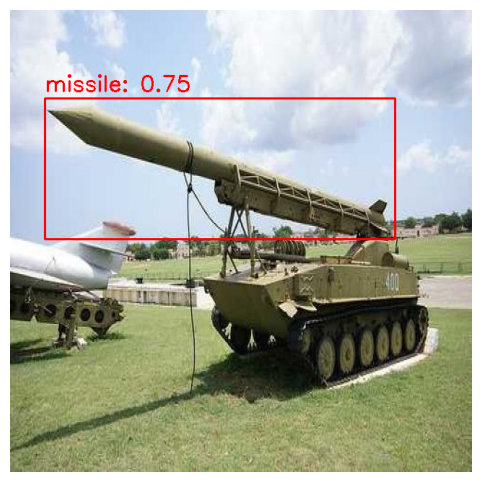


0: 640x640 1 missile, 36.6ms
Speed: 1.6ms preprocess, 36.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


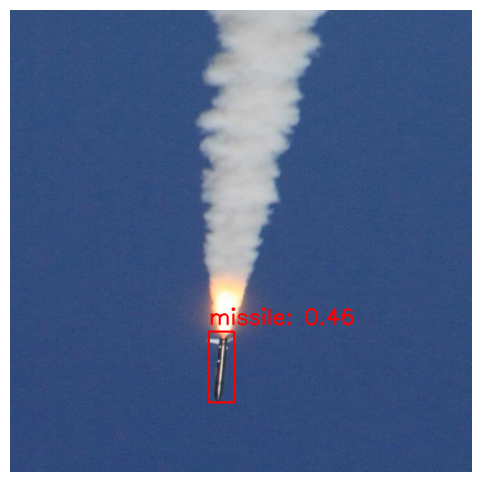


0: 640x640 1 missile, 36.6ms
Speed: 1.7ms preprocess, 36.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


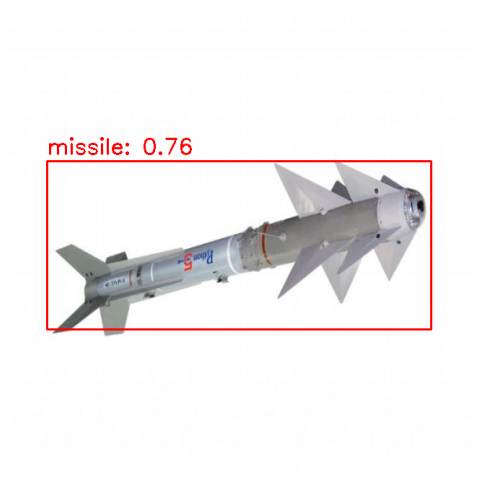


0: 640x640 (no detections), 36.1ms
Speed: 2.8ms preprocess, 36.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


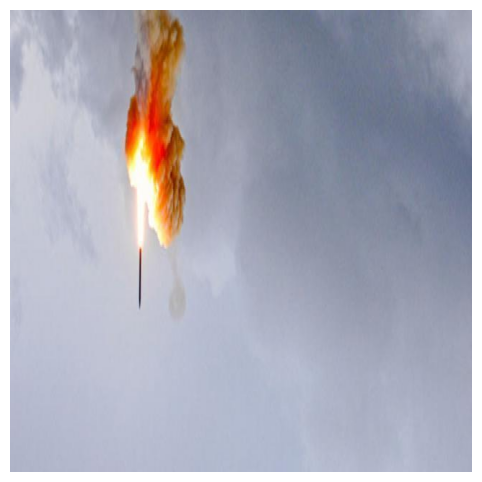


0: 640x640 5 missiles, 36.4ms
Speed: 1.7ms preprocess, 36.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


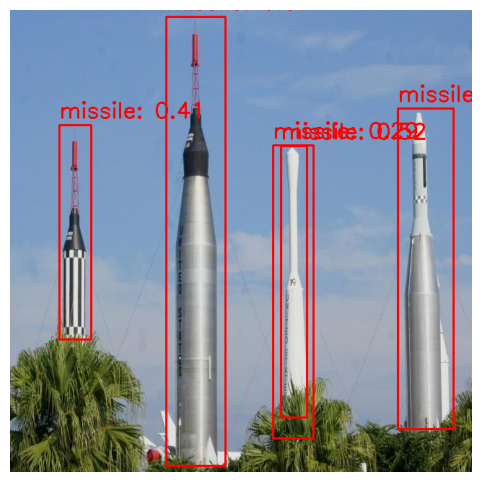


0: 640x640 1 missile, 36.6ms
Speed: 1.6ms preprocess, 36.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


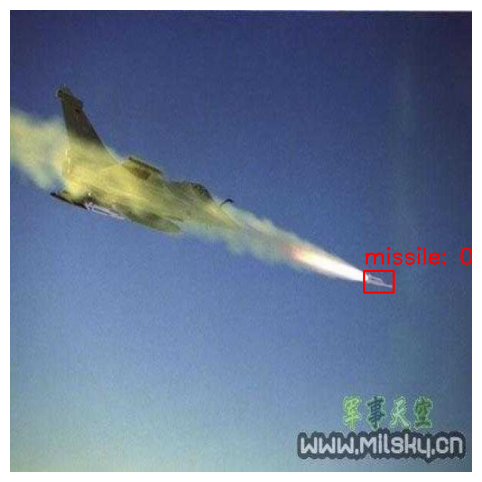


0: 640x640 1 missile, 36.5ms
Speed: 1.7ms preprocess, 36.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


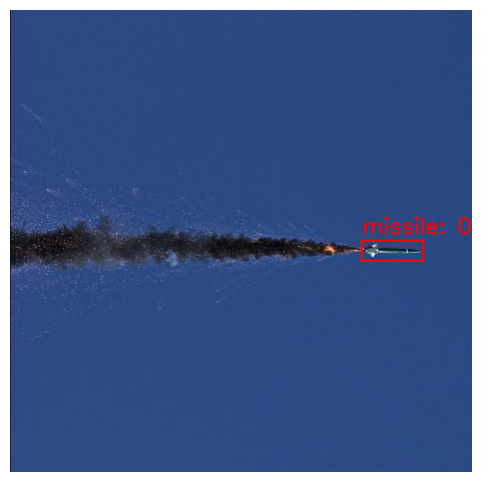


0: 640x640 1 missile, 36.0ms
Speed: 1.5ms preprocess, 36.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


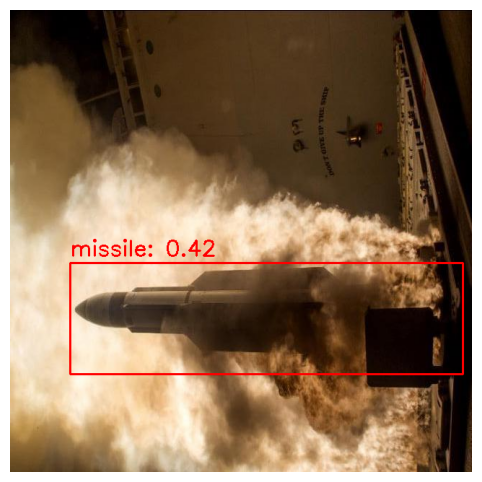


0: 640x640 1 missile, 36.5ms
Speed: 1.6ms preprocess, 36.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


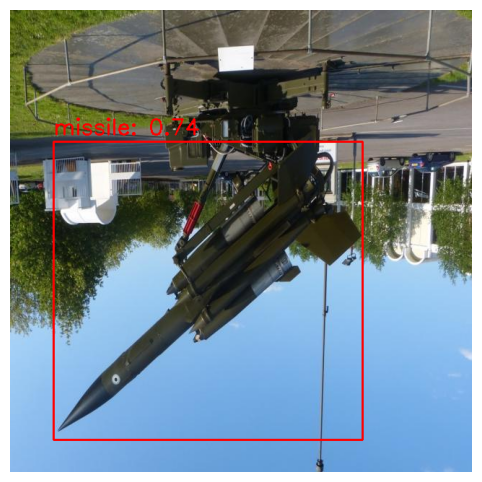


0: 640x640 1 missile, 36.5ms
Speed: 2.1ms preprocess, 36.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


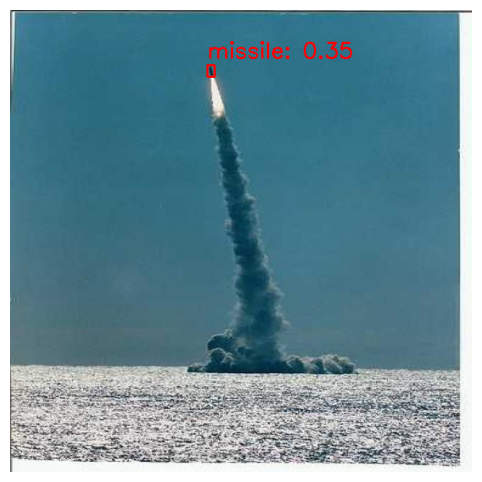


0: 640x640 1 missile, 39.7ms
Speed: 1.7ms preprocess, 39.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


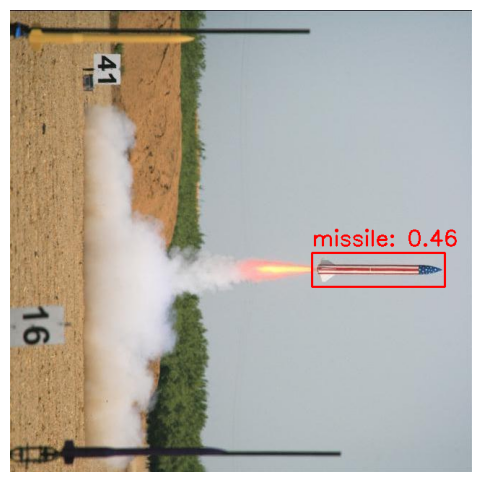


0: 640x640 1 missile, 40.0ms
Speed: 2.2ms preprocess, 40.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


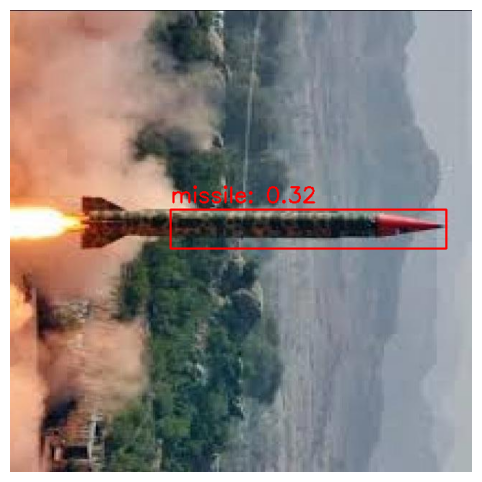


0: 640x640 2 missiles, 39.6ms
Speed: 1.7ms preprocess, 39.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


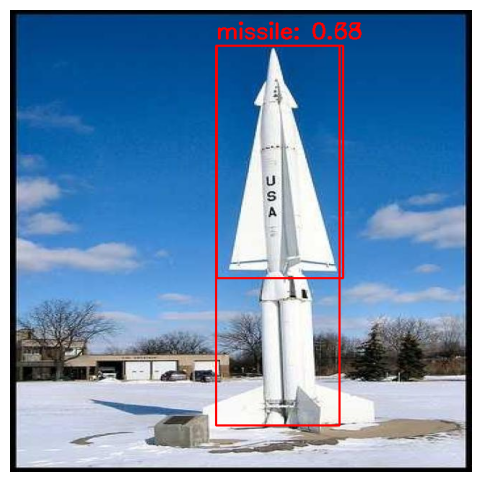


0: 640x640 2 missiles, 39.6ms
Speed: 1.6ms preprocess, 39.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


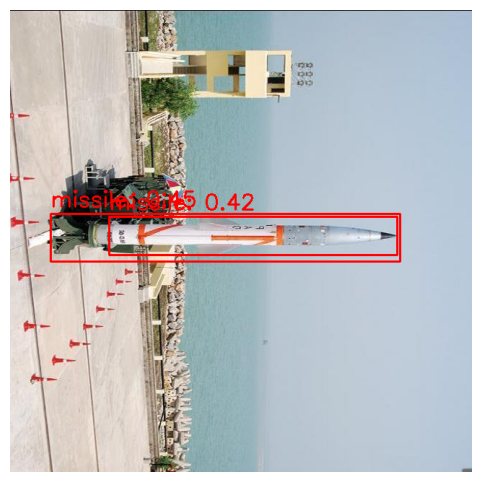


0: 640x640 1 missile, 39.5ms
Speed: 1.8ms preprocess, 39.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


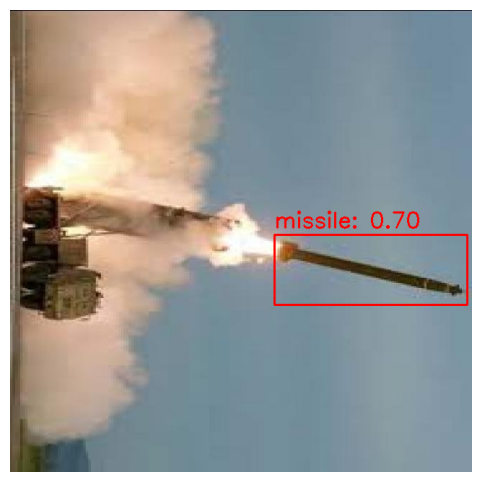


0: 640x640 1 missile, 40.0ms
Speed: 2.3ms preprocess, 40.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


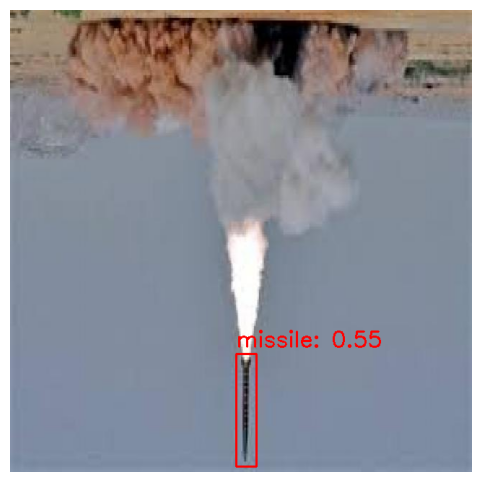


0: 640x640 1 missile, 40.0ms
Speed: 2.1ms preprocess, 40.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


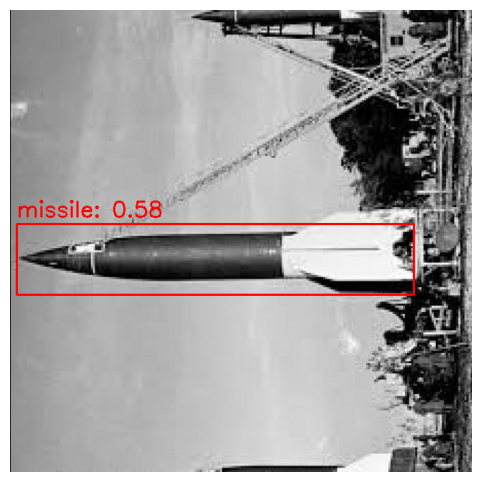

In [12]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Define the path to the test images directory
test_dataset_dir = "/kaggle/working/Missile-Detection-7/test/images"

# Get the list of images in the test dataset directory
test_images = os.listdir(test_dataset_dir)

# Load the YOLO model
model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

# Iterate over the test images at intervals (e.g., every 49 images)
for img_id in range(0, len(test_images), 49):
    # Load the image
    image_path = os.path.join(test_dataset_dir, test_images[img_id])
    image = cv2.imread(image_path)

    if image is None:
        print(f"Could not read image {image_path}")
        continue

    # Perform object detection
    detections = model(image)
    result = detections[0]

    class_ids = result.boxes.cls.cpu().numpy()  # Class IDs
    confidences = result.boxes.conf.cpu().numpy()  # Confidence scores
    bboxes = np.array(result.boxes.xyxy.cpu(), dtype="int")  # Bounding boxes

    for i, bbox in enumerate(bboxes):
        x, y, x2, y2 = bbox
        cv2.rectangle(image, (x, y), (x2, y2), (0, 0, 255), 2)  # Red bounding box

        class_id = int(class_ids[i])
        confidence = float(confidences[i])
        label = f"{model.names[class_id]}: {confidence:.2f}"

        cv2.putText(image, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    # Convert BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image with bounding boxes using matplotlib
    plt.figure(figsize=(8, 6))
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.show()
